Dependencies | Version
--- | ---
SatPy | 0.20.1
Pyresample | 1.12.3
Trollimage | 1.11.0
Pykdtree | 1.3.1


# Pytroll supporting the NWCSAF

<p>The NWCSAF delivers two software packages that can output cloud, precipitation, instability and wind parameters useful in Nowcasting. The software can be run locally on data received via EUMETCast or via a direct readout station operating in L- and X-band. The software support Geostationary satellite data is called NWCSAF/geo and the other one for polar orbiting satellites is NWCSAF/PPS. 
</p>
    
<p>Both the NWCSAF/Geo and PPS software packages are installed and run at the EUMETSAT headquarters in Darmstadt and provides real-time services delivering some of the NWCSAF parametes in near-real time over EUMETCast.
</p>

<p>
Here we will show some examples on how you can read, project and display some of the parameters provided by the NWCSAF, using the Satpy library of the open source Pytroll suite of software tools. The focus will be on the cloud parameters.
    </p>

## Get some data
<p>
    First download some sample data for these examples. We have uploaded some data to Zenodo. For example: <a class="reference external" href=https://zenodo.org/record/3702153/files/W_XX-EUMETSAT-Darmstadt%2CSING+LEV+SAT%2CMETOPB+CMA_C_EUMS_20200309080000_38780.nc.bz2>One example EUMETSAT PPS Cloud mask granule</a>. Place the data in your /tmp directory
</p>

## Loading and concatenating the cloud type granules
We start by loading and working with the Cloud type and CTTH products as disseminated over EUMETCast.

In [15]:
from satpy import Scene
from satpy import find_files_and_readers
from datetime import datetime

DATA_DIR = "/tmp"

myfiles = find_files_and_readers(base_dir=DATA_DIR,
                                 start_time=datetime(2020, 3, 9, 8, 0),
                                 end_time=datetime(2020, 3, 9, 8, 19),
                                 reader='nwcsaf-pps_nc')
scene = Scene(filenames=myfiles)
scene.load(['ct'])

Now we have loaded and concatenated the <em>ct</em> field of the Cloudtype product granules in the time window given by the start and end times above

In [16]:
print(scene['ct'].data.shape)
print(scene['ct'].data.compute())

(6955, 2048)
[[ 2  2  2 ...  1  1  1]
 [ 2  2  2 ...  1  1  1]
 [ 2  2  2 ...  1  1  1]
 ...
 [ 6  6 10 ...  8  8  9]
 [ 6  6  6 ...  8  8  9]
 [ 6  6  6 ...  8  8  9]]


<p>Also the geolocation has been unpacked. That is the the full resolution
geolocation information has been recreated from the tie point grid by
interpolating and extrapolating the longitudes and latitudes on the tie point
grid. This is accomplished using the <a class="reference external" href="http://www.github.com/adybbroe/python-geotiepoints">python-geotiepoints</a> tool, but this is
transparent to the user:</p>

In [17]:
print(scene['ct'].area.lats.shape)

(6955, 2048)


<p>
Now let’s visualise the cloudtype data using the Nowcasting SAF palette read from the file. We are using a pre-defined Satpy "composite" called <code>cloudtype</code>. It takes the <code>ct</code> data and apply the <code>ct-palette</code> in the netCDF file.  
</p>

<p>
For a little inside in Satpy the <code>cloudtype</code> composite is defined the same way for all sensors in the yaml configuration file <code>satpy/etc/composites/visir.yaml</code> like this:
</p>
<code>
  cloudtype:
    compositor: !!python/name:satpy.composites.PaletteCompositor
    prerequisites:
    - ct
    - ct_pal
    standard_name: cloudtype
</code>


<p>
    Satpy comes with a wealth of pre-defined "composites", but can be enhanced easily for local purposes.
    </p>
    

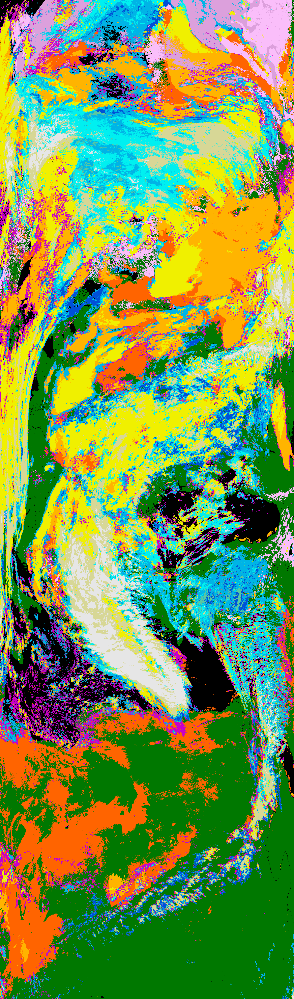

In [18]:
scene.load(['cloudtype'])
scene.show('cloudtype')

<a href=https://zenodo.org/record/3702153/files/ears_nwc_cloudtype_20200309T0800Z_20200309T0819Z.png>Reference image</a>

## Load all CTTH granules, concatenate, reproject, generate composite image, and save to disk

In [21]:
from glob import glob
import os.path

In [22]:
DATA_DIR = "/tmp"

### Make a list of all CTTH files in the directory, both bzipped and unpacked ones:

In [23]:
myfiles = glob(os.path.join(DATA_DIR, "*CTTH_C*.nc.bz2"))
myfiles = myfiles + glob(os.path.join(DATA_DIR, "*CTTH_C*.nc"))

### Generate the scene object

In [24]:
scene = Scene(filenames=myfiles, reader='nwcsaf-pps_nc')

### Load the cloud height composite image

In [25]:
scene.load(['cloud_top_height'])

/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)


### Resample the data to the pre-defined "euron1" area

In [26]:
lscn = scene.resample('euron1', radius_of_influence=8000)

/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/pyproj/crs/crs.py:539: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)


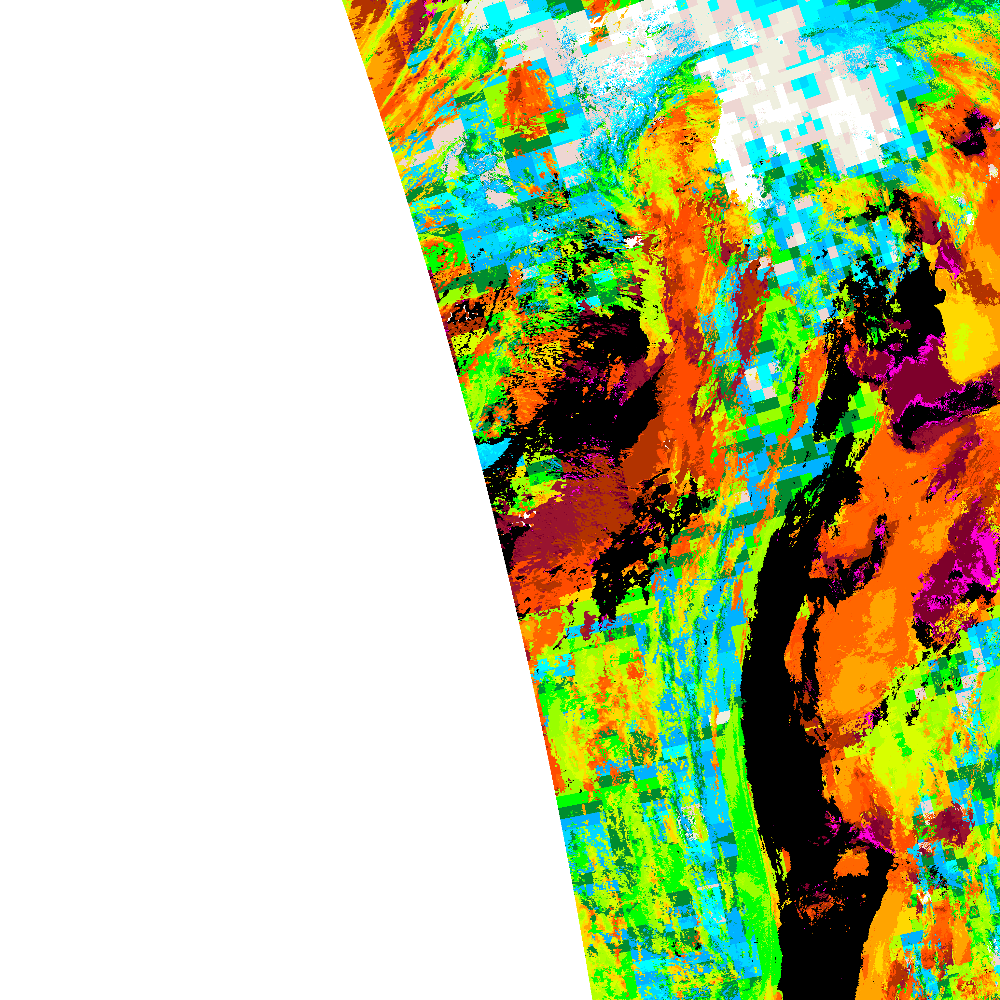

In [27]:
lscn.show('cloud_top_height')

<a href=https://zenodo.org/record/3702153/files/ears_nwc_ctth_20200309T0800Z_20200309T0819Z_euron1.png>Reference image</a>

### Save the image to file

In [28]:
dt_start = lscn.attrs['start_time'].strftime('%Y%m%dT%H%MZ')
dt_end = lscn.attrs['end_time'].strftime('%Y%m%dT%H%MZ')
lscn.save_dataset(
    'cloud_top_height', filename='./ears_nwc_ctth_{starttime}_{endtime}.png'.format(starttime=dt_start, endtime=dt_end))

/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)


## Processing the same scene received locally

The above imagery is using the data from the EARS-NWC EUMETCast service. This service currently provides the cloud mask, cloudtype and CTTH products from Metop-B and NOAA-19. However, the version currently used (v2014) is not the most recent one. Below we show that reading the locally received data from the version 2018 version.

In [34]:
myfiles = glob(os.path.join(DATA_DIR, 'S_NWC*metopb_38780*nc'))
scene = Scene(filenames=myfiles, reader='nwcsaf-pps_nc')
scene.load(['cloudtype', 'cloud_top_height'])
lscn = scene.resample('euron1', radius_of_influence=8000)

Can't load ancillary dataset -
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/pyproj/crs/crs.py:539: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


We have now loaded and reprojected both the cloudtype and the cloud_top_height composites onto the euron1 area. Let's visualise the remapped cloud height parameter and overlay coastlines and political borders. To do this one needs access to shapefiles containg that information. Visit the <a href=https://pycoast.readthedocs.io/en/latest/>pycoast</a> pages to see how.

/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in greater_equal
  return func(*args2)
/home/a000680/miniconda3/envs/python3/lib/python3.7/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in less_equal
  return func(*args2)


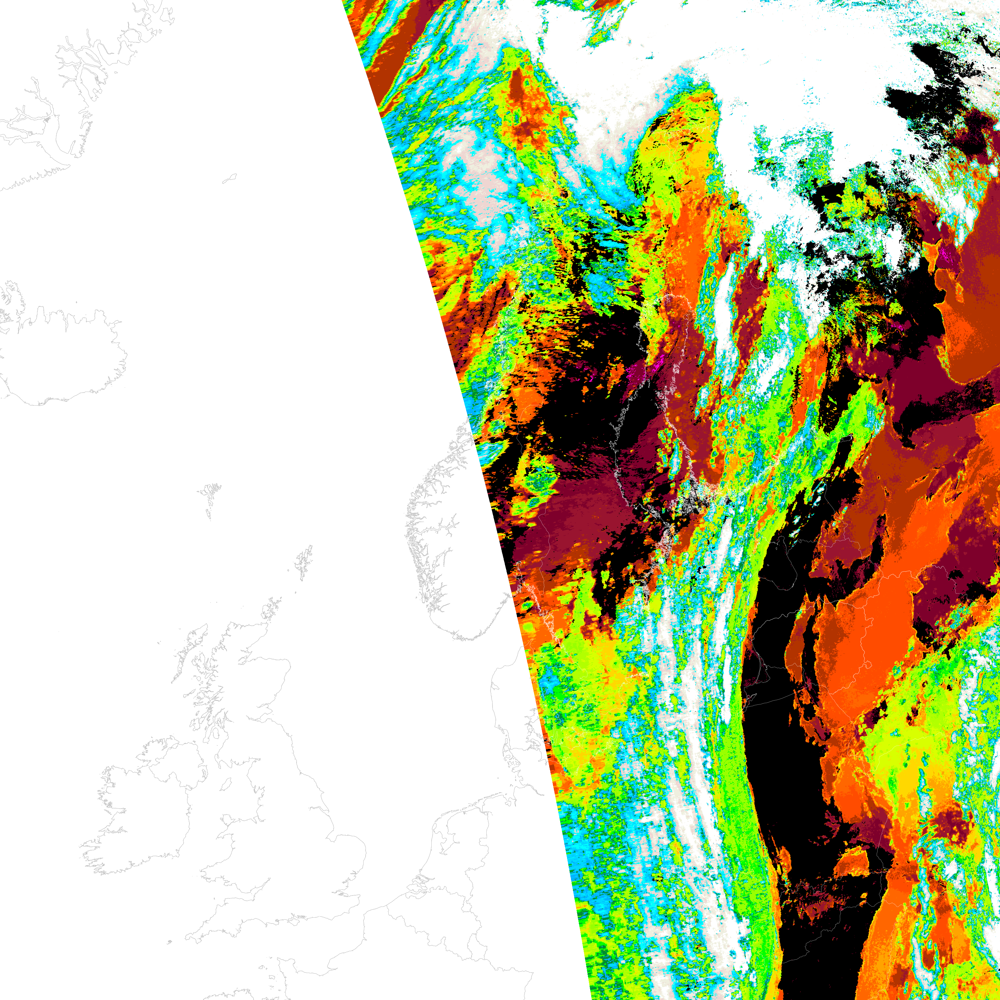

In [35]:
lscn.show('cloud_top_height', overlay={'coast_dir': '/home/a000680/data/shapes/', 'color': 'white'})